<a href="https://colab.research.google.com/github/Madhur6234/Multi-class-Dog-Breed-Classification/blob/main/dog_breed_identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **🐶 Multi-class Dog Breed Classification**

This notebook builds an end-to-end multi-class image classifier 
using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given the image of a dog.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them). 

In [ ]:
# Unzip the uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/Colab Notebooks/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/Dog Vision/data"

## **🔧Get our workspace ready**

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [ ]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub

print("TensorFlow version:", tf.__version__)
print("TensorFlow Hub version:", hub.__version__)

# Check for GPU availability
print("GPU:", "Available😀" if tf.config.list_physical_devices("GPU") else "Not Available😥")

TensorFlow version: 2.5.0
TensorFlow Hub version: 0.12.0
GPU: Available😀


## **📚Getting our data ready**

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first.

Turning our images into Tensors (numerical representations).

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Colab Notebooks/Dog Vision/data/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Describe the labels
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,c3e1b303c9f7cfc15f57038400548af8,scottish_deerhound
freq,1,126


In [ ]:
# Number of images for each breed
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
komondor                 67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

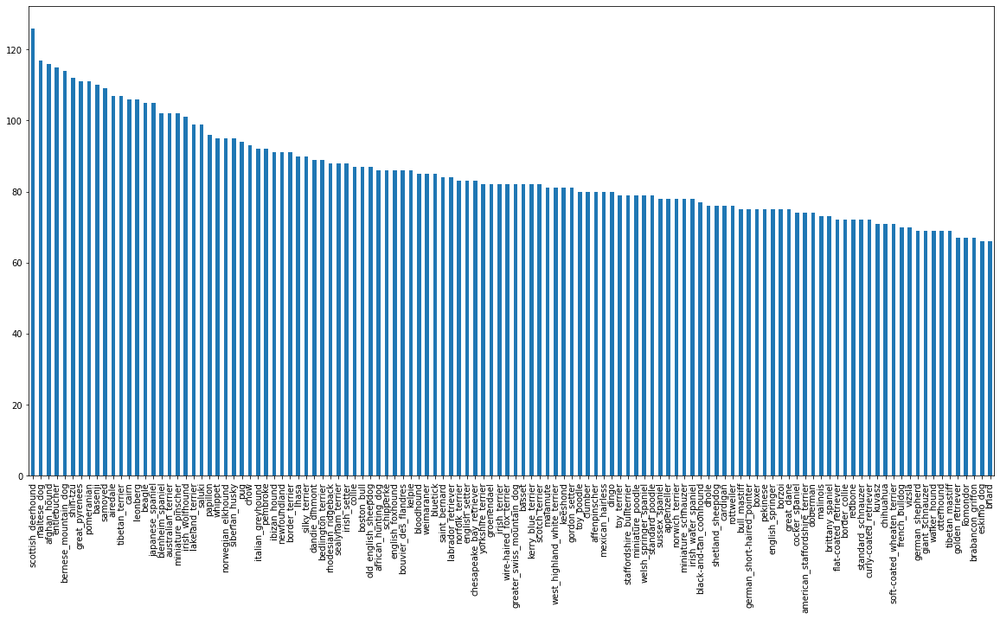

In [ ]:
# Number of images for each breed
labels_csv["breed"].value_counts().plot(kind="bar", figsize=(20, 10));

In [ ]:
# Median number of images per class
labels_csv["breed"].value_counts().median()

82.0

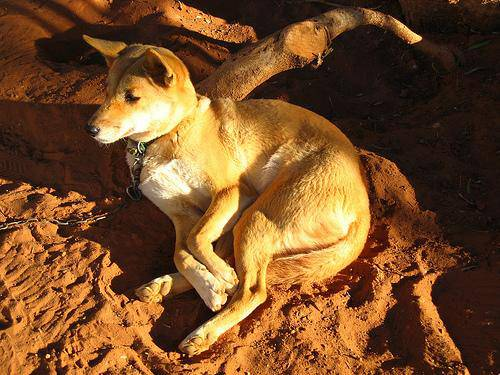

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Colab Notebooks/Dog Vision/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


### **Getting images and their labels**

#### 1. **Let's get a list of all of our image file pathnames.**

In [ ]:
# Create a pathnames for image ID's
filenames = ["drive/MyDrive/Colab Notebooks/Dog Vision/data/train/" + fname for fname in labels_csv["id"] + ".jpg"]

# Check the first 10
filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog Vision/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Colab Notebooks/Dog Vision/data/train/")) == len(filenames):
  print("Filenames match actual amount of files.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files.


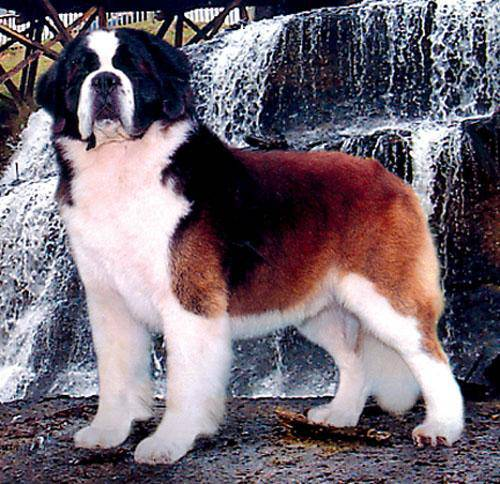

In [ ]:
# Check random image
Image(filenames[2906])

In [ ]:
# Let's check it's breed's name
labels_csv["breed"][2906]

'saint_bernard'

#### 2. **Let's prepare our labels**

In [ ]:
# Create a list of labels
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)             # OR --> labels = labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Number of labels
len(labels)

10222

In [ ]:
# Check if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames.")
else:
  print("Number of labels does not match number of filenames, check data directories.")

Number of labels matches number of filenames.


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Total number of unique breeds
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean array (like an upper array)
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
len(labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0])                               # original label
print(np.where(unique_breeds == labels[0]))    # index where label occur
print(boolean_labels[0].argmax())              # index where label occur in boolean array
print(boolean_labels[0].astype(int))           # there will be 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### **Creating our own validation dataset**

In [ ]:
# Setup X (features) and y (labels)
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_valid, y_train, y_valid = train_test_split(X[:NUM_IMAGES], 
                                                      y[:NUM_IMAGES],
                                                      test_size=0.2,
                                                      random_state=42)

In [ ]:
len(X_train), len(y_train), len(X_valid), len(y_valid)

(800, 800, 200, 200)

### **Preprocessing Images (turning images into Tensors)**

To preprocess our images into Tensors, we're going to write a function which does a few things:

>1. Take an image file path as input.
2. Use TensorFlow to read the file and save it to a variable, image.
3. Turn our images (jpg) into Tensors.
4. Normalize our image (convert colour channel values from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image.

Before we do, let's see what importing an image looks like *(example with any random image)*.

In [ ]:
# Example with a single image:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# Range of pixel values
image.max(), image.min()

(255, 0)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
# Turn image into a Tensors
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

**Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.**

>1. Take an image file path as input.
2. Use TensorFlow to read the file and save it to a variable, image.
3. Turn our images (jpg) into Tensors.
4. Normalize our image (convert colour channel values from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image.

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into Tensor.
  """

  # Read in an imge file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the colour channel values form 0-255 to 0-1 values (normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])

  return image

### **Turning data into batches**

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and associated label,
  preprocesses the image and return a tuple of (image, label).
  """
  image = process_image(image_path)
  return (image, label)

Now we've got a way to turn our data into tuples of Tensors, let's make a function to turn all of our data (`X & y`) into batches.

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of the image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """

  # If the data is a test data (no labels)
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))   # only file path (no labels)
    data_batch = data.map(process_image).batch(batch_size)

  # If the data is a validation data
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),    # filepaths
                                               tf.constant(y)))   # labels
    data_batch = data.map(get_image_label).batch(batch_size)
  
  # Else the data must be a training data
  else:
    print("Creating training data batches...")

    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(batch_size)

  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_valid, y_valid, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### **Visualizing data batches**

Our data is now in batches, however, these can be a little hard to understand, let's visualize them.

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batches
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batches.
  """

  # Setup a figure
  plt.figure(figsize=(10, 10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):

    # Create a subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)

    # Display an image
    plt.imshow(images[i])

    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])

    # Turn the grid line off
    plt.axis("off")

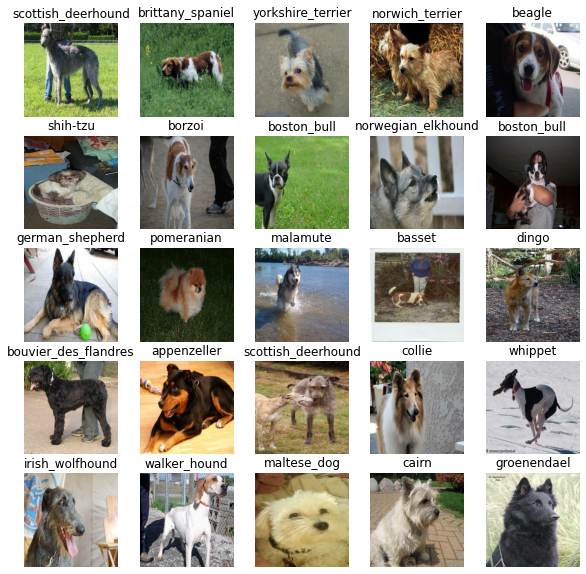

In [ ]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

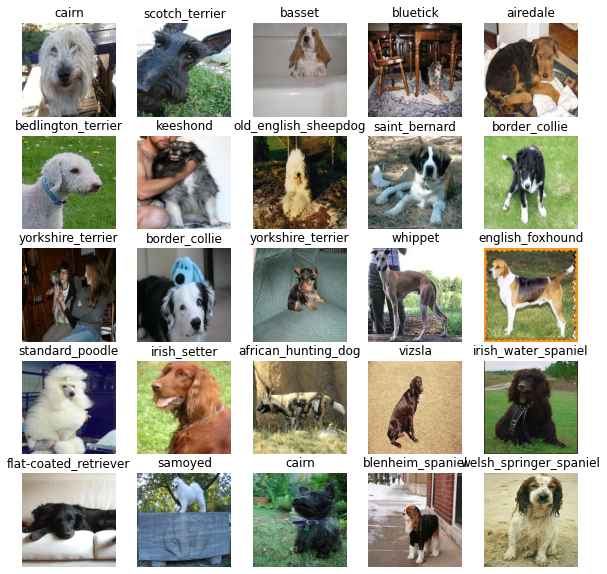

In [ ]:
# Now let's visualize the data in a validation batch
valid_images, valid_labels = next(valid_data.as_numpy_iterator())
show_25_images(valid_images, valid_labels)

## **📐Modelling**

### **Building a model**

Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]       # batch, height, width, colour channel

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

**Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model.**

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  """
  1. Takes the input shape, output shape and the model we've chosen as parameters.
  2. Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
  3. Compiles the model (says it should be evaluated and improved).
  4. Builds the model (tells the model the input shape it'll be getting).
  5. Returns the model.
  """
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL),                    # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,     # Layer 2 (output layer)
                          activation="softmax")
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### **Creating callbacks**

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving (**`early stopping`**).

We'll create two callbacks, one for **TensorBoard** which helps track our model progress and another for **early stopping** which prevents our model from training for too long. 

#### **TensorBoard callback**

To setup TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoad callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load TensorBoad notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():

  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Colab Notebooks/Dog Vision/logs",
                         # Make it so the logs get tracked whenever we run an experiment
                         datetime.datetime.now().strftime("%d%m%Y-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir)

#### **Early stopping callback**

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

### **Training a model (on subset of data)**

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU:", "Available😀" if tf.config.list_physical_devices("GPU") else "Not Available😥")

GPU: Available😀


**Let's create a function which trains a model.**

* Create a model using `create_model()` function.
* Setup a TensorBoard callback using `create_tensorboard_callback()` function.
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use.
* Return the model.

In [ ]:
# Create a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 133s 4s/step - loss: 4.7549 - accuracy: 0.0700 - val_loss: 3.4399 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 3s 117ms/step - loss: 1.7207 - accuracy: 0.6687 - val_loss: 2.1678 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 3s 116ms/step - loss: 0.5821 - accuracy: 0.9400 - val_loss: 1.6482 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 3s 116ms/step - loss: 0.2621 - accuracy: 0.9925 - val_loss: 1.4426 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 3s 117ms/step - loss: 0.1479 - accuracy: 0.9962 - val_loss: 1.3577 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 3s 117ms/step - loss: 0.1015 - accuracy: 1.0000 - val_loss: 1.3184 - val_accuracy: 0.6650
Epoch 7/100
25/25 [==============================

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### **Checking the TensorBoard logs**

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/Dog\ Vision/logs

<IPython.core.display.Javascript object>

### **Making and evaluating predictions using a trained model**

In [ ]:
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 4s 83ms/step


array([[1.0753459e-03, 1.2523023e-04, 5.6950795e-04, ..., 1.0534452e-03,
        2.2421604e-05, 2.2838225e-03],
       [2.4119986e-03, 1.1401118e-03, 2.2637347e-02, ..., 9.7751152e-04,
        5.8017517e-03, 5.3519011e-04],
       [2.9063576e-05, 7.4617194e-05, 4.1041752e-05, ..., 1.2931411e-04,
        1.8605485e-04, 1.1983016e-03],
       ...,
       [1.9472474e-05, 7.7842415e-06, 1.0120341e-04, ..., 8.6782193e-06,
        7.3955613e-05, 1.6470967e-04],
       [2.4566946e-03, 6.8313594e-04, 2.1182040e-04, ..., 7.0473866e-04,
        1.7672907e-04, 5.3737392e-03],
       [6.9390918e-04, 6.4469685e-05, 4.7450778e-03, ..., 1.3925385e-03,
        9.9425006e-04, 1.8159747e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_valid)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.8106299e-04 3.6171559e-04 2.7293796e-04 2.0687748e-04 3.3249872e-04
 9.2533861e-05 1.0092062e-04 9.6204726e-04 1.2943348e-02 4.4081576e-02
 6.0640068e-05 2.4821213e-05 3.8478585e-04 1.3838519e-03 5.3641025e-04
 1.1084116e-03 4.6877696e-05 1.3760163e-03 9.8698935e-04 6.6780997e-04
 1.8314533e-05 6.9840468e-04 6.8131616e-05 6.8734771e-05 6.9222525e-03
 1.1723007e-04 5.0136689e-05 8.2170031e-05 3.8443098e-04 7.3247931e-05
 3.8339651e-05 3.3605669e-04 2.2587818e-05 5.1523239e-05 2.9634182e-05
 3.4548837e-05 1.5302315e-04 3.5437453e-04 2.5326377e-04 3.5491180e-01
 1.7253030e-04 1.3491695e-04 3.7724858e-03 1.2080385e-05 1.3781977e-03
 1.1297050e-05 1.7444372e-04 3.1968008e-04 1.5056364e-05 2.9882789e-04
 7.6189346e-05 2.0881594e-04 1.8210366e-04 2.0347913e-03 7.5942269e-05
 2.4890894e-04 1.5259253e-04 5.5809716e-05 6.3227490e-05 1.7577744e-05
 9.6435047e-05 3.5987666e-04 5.7465195e-06 1.2546364e-04 1.3526996e-04
 1.2084354e-04 2.4657889e-04 4.0308235e-04 2.5123823e-04 1.2333401e-05
 1.302

Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[29])
pred_label

'dingo'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays
  of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  
  return images, labels

In [ ]:
# Unbatchify the validation data
val_images, val_labels = unbatchify(valid_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

### **Visualizing and evaluating model prediction**

Now we've got ways to get get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

**Let's make some function to make these all a bit more visaulize.**

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probalibities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n.
  """
  pred_prob, true_label, image = prediction_probalibities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
            color=color)

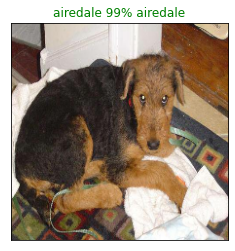

In [ ]:
plot_pred(prediction_probalibities=predictions, 
          labels=val_labels,
          images=val_images,
          n=4)

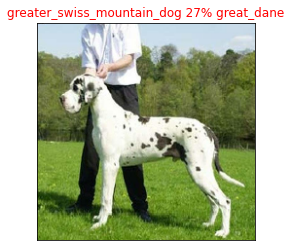

In [ ]:
plot_pred(prediction_probalibities=predictions, 
          labels=val_labels,
          images=val_images,
          n=99)

**Now we've got one function to visualize our models top prediction, let's make another to view our top 10 predictions.**

The function will:
* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using `get_pred_label()`.
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, colouring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change colour of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

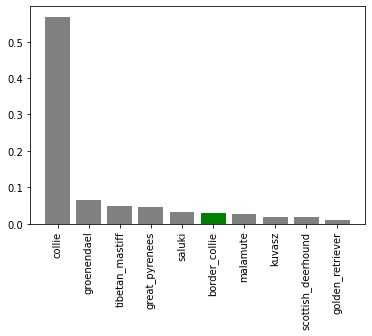

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

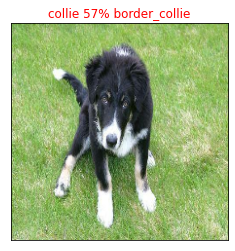

In [ ]:
plot_pred(prediction_probalibities=predictions, 
          labels=val_labels,
          images=val_images,
          n=9)

**Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.**

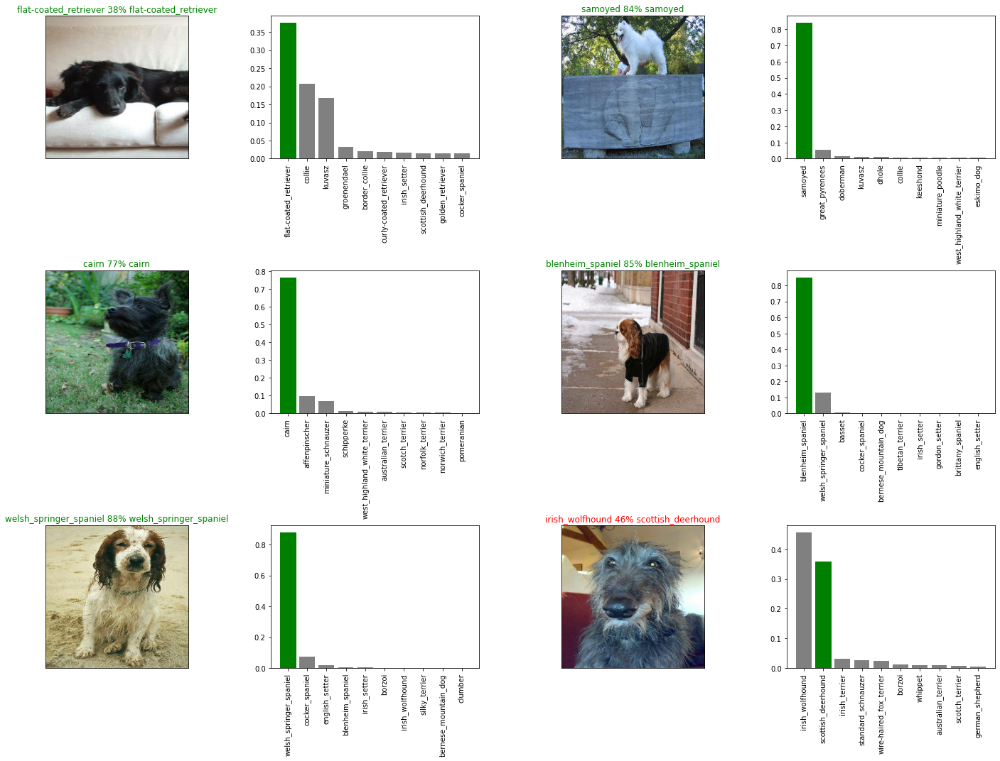

In [ ]:
# Let's check our a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):

  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probalibities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  
plt.tight_layout(h_pad=1.0)
plt.show()

### **Saving and reloading a trained model**

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in the models directory and appends the suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Colab Notebooks/Dog Vision/models",
                          datetime.datetime.now().strftime("%d%m%Y-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"  # Save format of model

  print(f"Saving model to: {model_path}...")
  model.save(model_path)

  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  
  return model

**Now we've got functions to save and load a trained model, let's make sure they work.**

In [ ]:
# Save our model trained on a 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Colab Notebooks/Dog Vision/models/29052021-181950-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Colab Notebooks/Dog Vision/models/29052021-181950-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
load_1000_image_model = load_model("drive/MyDrive/Colab Notebooks/Dog Vision/models/29052021-181950-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Colab Notebooks/Dog Vision/models/29052021-181950-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(valid_data)

7/7 [==============================] - 1s 75ms/step - loss: 1.2225 - accuracy: 0.6850


[1.222542643547058, 0.6850000023841858]

In [ ]:
# Evaluate the loaded model
load_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 1s 82ms/step - loss: 1.2225 - accuracy: 0.6850


[1.222542643547058, 0.6850000023841858]

## **🐕‍🦺 Training model on full dataset (a big dog model)**

In [ ]:
# Size of full data
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1517s 5s/step - loss: 1.3559 - accuracy: 0.6686
Epoch 2/100
320/320 [==============================] - 30s 93ms/step - loss: 0.4021 - accuracy: 0.8853
Epoch 3/100
320/320 [==============================] - 30s 93ms/step - loss: 0.2383 - accuracy: 0.9346
Epoch 4/100
320/320 [==============================] - 30s 93ms/step - loss: 0.1558 - accuracy: 0.9620
Epoch 5/100
320/320 [==============================] - 30s 92ms/step - loss: 0.1052 - accuracy: 0.9779
Epoch 6/100
320/320 [==============================] - 30s 92ms/step - loss: 0.0780 - accuracy: 0.9864
Epoch 7/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0574 - accuracy: 0.9922
Epoch 8/100
320/320 [==============================] - 30s 92ms/step - loss: 0.0479 - accuracy: 0.9934
Epoch 9/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0373 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 29s 92ms/step - l

In [ ]:
# Save the full model
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Colab Notebooks/Dog Vision/models/28052021-211807-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Colab Notebooks/Dog Vision/models/28052021-211807-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load the full model
loaded_full_model = load_model("drive/MyDrive/Colab Notebooks/Dog Vision/models/28052021-211807-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Colab Notebooks/Dog Vision/models/28052021-211807-full-image-set-mobilenetv2-Adam.h5


### **Making predictions on the test dataset**

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model. 

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Colab Notebooks/Dog Vision/data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

# First 10 test_filenames
test_filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog Vision/data/test/e3a2e1a4c44509d7aa7777d88c5cd45a.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/test/e241bfdd5cc6154698394905abaa0d76.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/test/dcdffa00518844bd21499db49979f9c8.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/test/e7afb35b8252782013a6700e28e327fa.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/test/deb063345bf2b6752e2fe25cad096547.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/test/e6d6ff5b33e6174158d5ab05a7eda95c.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/test/def639bab46dfc714234180be730ef49.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/test/e5de4eec61d00ee4834ff0153f90ed41.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/test/e079440ee0061b92ec22faf17be13908.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/data/test/e647098485898391b700270c61824282.jpg']

In [ ]:
# Length of test_filenames
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(X=test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an ~1hr).

This is because we have to process ~10,000+ images and get our model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1555s 5s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Colab Notebooks/Dog Vision/data/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Colab Notebooks/Dog Vision/data/preds_array.csv", delimiter=",")

In [ ]:
# First 10 predictions
test_predictions[:10]

array([[3.67822162e-10, 2.30438368e-12, 1.52114194e-12, ...,
        1.13195870e-13, 1.45622629e-11, 4.76530033e-08],
       [7.51312600e-14, 5.27558140e-13, 4.79648602e-13, ...,
        8.56396724e-12, 4.67230090e-17, 1.07798961e-08],
       [3.07330246e-12, 5.41213904e-15, 1.36013872e-15, ...,
        8.41364534e-10, 7.49760920e-10, 2.74266151e-14],
       ...,
       [1.19318585e-12, 5.48167794e-04, 2.94695435e-10, ...,
        5.56559909e-09, 6.23490426e-11, 9.23161192e-09],
       [3.37958793e-11, 6.76798007e-10, 2.46932487e-12, ...,
        1.02949189e-15, 8.98092093e-14, 7.30436903e-16],
       [2.83216899e-08, 2.82343250e-15, 4.09662917e-08, ...,
        8.54510176e-07, 1.95567420e-08, 1.98341521e-09]])

In [ ]:
# Shape of test_predictions
test_predictions.shape

(10357, 120)

### **Preparing test dataset predictions for Kaggle**

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# Create a pandas DataFrame with an empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3a2e1a4c44509d7aa7777d88c5cd45a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e241bfdd5cc6154698394905abaa0d76,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dcdffa00518844bd21499db49979f9c8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e7afb35b8252782013a6700e28e327fa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,deb063345bf2b6752e2fe25cad096547,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3a2e1a4c44509d7aa7777d88c5cd45a,3.67822e-10,2.30438e-12,1.52114e-12,5.9615e-11,3.30782e-11,3.01223e-10,1.66807e-10,2.71313e-12,4.17908e-11,4.22207e-09,2.18082e-12,5.52088e-08,2.27824e-12,0.999626,4.2792e-12,1.16885e-10,6.76231e-13,9.377e-11,4.19311e-12,1.6628e-08,2.10755e-12,2.51879e-10,1.62229e-09,2.05758e-13,7.03497e-06,1.45398e-10,3.57459e-10,8.84279e-13,6.24739e-13,1.55817e-08,2.19507e-11,1.53524e-09,3.94089e-06,4.55056e-10,9.6772e-12,1.04275e-10,3.04724e-10,1.12834e-12,4.65317e-11,...,1.05668e-10,4.87176e-11,1.706e-12,1.59963e-11,2.24299e-08,5.82291e-11,3.41236e-11,7.52517e-11,6.57328e-13,9.43856e-13,6.51696e-12,3.34086e-13,3.72285e-09,4.52064e-12,1.64127e-11,1.96879e-12,1.62241e-10,2.76276e-13,1.89387e-10,1.59348e-10,7.64986e-09,4.86026e-10,6.46768e-07,1.61797e-10,3.83036e-11,6.5233e-12,1.24213e-09,6.41439e-07,1.7509e-12,5.40486e-11,4.08771e-10,1.69845e-12,6.90115e-11,1.23663e-12,6.45928e-12,0.000360304,1.67159e-10,1.13196e-13,1.45623e-11,4.7653e-08
1,e241bfdd5cc6154698394905abaa0d76,7.51313e-14,5.27558e-13,4.79649e-13,1.27127e-13,7.39455e-15,4.25892e-15,1.73647e-12,8.05751e-15,3.57096e-15,1.14471e-14,2.46304e-12,1.10168e-15,1.82672e-13,1.4768e-11,4.44924e-13,1.12548e-13,3.90076e-18,1,8.01533e-16,1.00066e-12,2.34286e-12,8.85674e-11,4.36012e-08,4.08015e-14,7.74452e-16,3.63953e-13,5.39472e-13,1.49849e-17,1.07457e-13,2.93236e-10,9.72091e-18,1.00504e-15,1.51134e-14,6.97202e-18,2.86252e-13,1.50648e-12,1.0819e-14,4.23368e-13,1.45531e-15,...,9.34963e-11,1.25578e-13,6.93435e-18,1.03732e-15,1.62295e-12,3.17553e-11,1.83941e-15,7.03325e-17,4.63987e-09,9.26637e-10,1.01964e-11,5.25948e-12,2.54741e-15,1.4606e-13,1.0685e-18,2.18281e-12,2.02561e-17,2.11291e-14,1.05591e-10,7.07538e-18,4.76857e-12,4.70571e-17,1.18622e-11,2.69508e-09,2.68417e-12,2.69253e-16,3.76631e-09,1.42874e-10,6.80943e-15,1.88013e-14,1.11109e-11,2.15986e-13,4.78496e-13,2.52169e-14,5.55148e-16,4.12876e-16,7.06729e-17,8.56397e-12,4.6723e-17,1.07799e-08
2,dcdffa00518844bd21499db49979f9c8,3.0733e-12,5.41214e-15,1.36014e-15,1.16913e-12,1.83172e-07,2.25618e-05,1.85538e-10,0.999966,2.73826e-10,8.40087e-12,3.45263e-13,4.713e-14,1.70509e-13,4.44282e-10,3.07478e-11,1.28755e-11,4.82614e-14,1.10472e-11,2.60357e-16,3.20923e-10,1.64769e-15,1.61216e-10,1.38063e-08,8.25255e-17,3.52045e-12,2.77743e-13,6.53028e-14,1.20219e-11,4.55567e-10,1.99343e-09,9.27694e-10,1.38077e-10,2.22502e-11,2.58897e-12,1.18511e-13,7.66149e-12,3.82883e-10,4.07232e-12,1.88597e-11,...,1.36727e-09,1.25644e-11,5.69783e-15,8.68441e-16,3.52324e-09,5.84952e-11,2.77024e-09,4.37723e-12,2.49248e-12,9.48928e-06,5.43698e-11,2.99346e-14,7.04547e-14,3.29408e-14,4.27472e-09,2.57495e-11,7.99988e-14,1.04417e-14,9.88689e-12,7.66142e-12,6.35849e-11,8.99649e-11,1.37308e-11,1.36684e-11,9.91254e-10,1.84493e-06,2.57712e-11,5.9102e-12,4.73837e-12,9.54892e-11,2.50478e-09,2.15355e-10,4.91287e-10,1.95967e-13,4.23188e-14,5.161e-11,7.60639e-13,8.41

In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Colab Notebooks/Dog Vision/data/full_model_predictions_submission_1_mobilenetv2.csv",
                index=False)

## **🐕Making predictions on custom images**

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
*Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Colab Notebooks/Dog Vision/custom-dog-images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Colab Notebooks/Dog Vision/custom-dog-images/yorkshire-terriers-1.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/custom-dog-images/yorkshire-terriers-2.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/custom-dog-images/shiba-inu-1.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/custom-dog-images/golden-retrievers-1.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/custom-dog-images/golden-retrievers-2.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/custom-dog-images/siberian-husky-1.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/custom-dog-images/siberian-husky-2.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/custom-dog-images/german-shepherds-1.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/custom-dog-images/french-bulldogs-1.jpg',
 'drive/MyDrive/Colab Notebooks/Dog Vision/custom-dog-images/bulldogs-1.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
# Shape of our custom predictions
custom_preds.shape

(10, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['yorkshire_terrier',
 'silky_terrier',
 'eskimo_dog',
 'labrador_retriever',
 'airedale',
 'kuvasz',
 'siberian_husky',
 'german_shepherd',
 'french_bulldog',
 'boxer']

In [ ]:
# Get custom images
custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

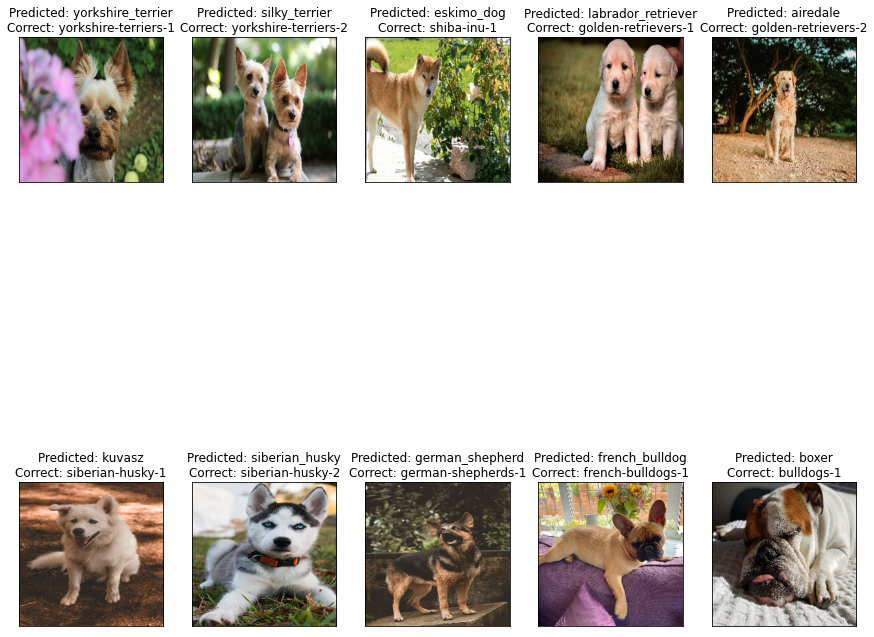

In [ ]:
# Check custom image predictions
plt.figure(figsize=(15, 15))
for i, image in enumerate(custom_images):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title("Predicted: " + custom_pred_labels[i] + "\n" + "Correct: " + custom_image_paths[i][59:].replace(".jpg", ""))
  plt.imshow(image)

In [ ]:
# Craete a function to plot custom data
def plot_pred_custom_data(prediction_probalibities, custom_pred_labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n.
  """
  pred_prob, image = prediction_probalibities[n], images[n]

  # Get the pred label
  pred_label = custom_pred_labels[n]

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change plot title to be predicted and the probability of prediction
  correct_label = custom_image_paths[n][59:].replace(".jpg", "")
  plt.title("Predicted: {} {:2.0f}% \nCorrect: {}".format(pred_label, np.max(pred_prob)*100, correct_label))

In [ ]:
# Create a function to plot custom data configuration
def plot_pred_conf_custom_data(prediction_probabilities, custom_pred_labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob = prediction_probabilities[n]

  # Get the predicted label
  pred_label = custom_pred_labels[n]

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

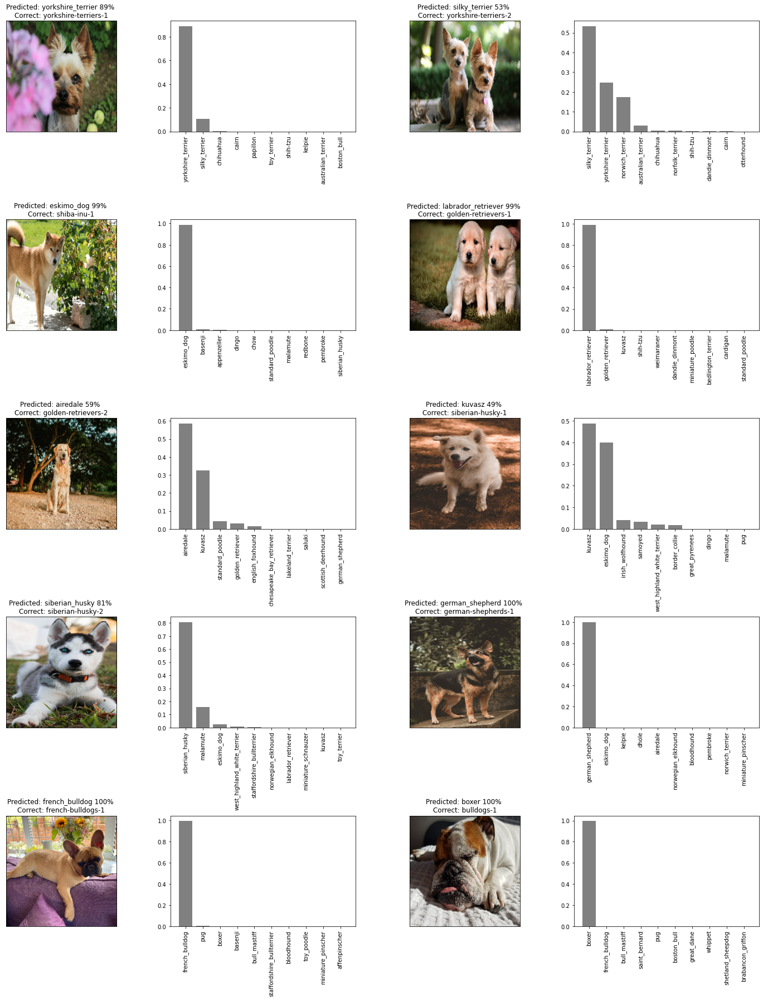

In [ ]:
# Let's check our custom data predictions and their different values
i_multiplier = 0
num_rows = 5
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):

  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred_custom_data(prediction_probalibities=custom_preds, 
                        custom_pred_labels=custom_pred_labels,
                        images=custom_images,
                        n=i+i_multiplier)
  
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf_custom_data(prediction_probabilities=custom_preds,
                             custom_pred_labels=custom_pred_labels,
                             n=i+i_multiplier)
  
plt.tight_layout(h_pad=1.0)
plt.show()